# EDA Of Global Death and Missing Migrants Data

#### According to the United Nation's International Office of Migration (IOM) report in 2020, one in thirty people are living in countries different from where they were born. IOM estimates that there were around 281 million international migrants in the world in 2020, which equates to 3.6 per cent of the global population. Unfortunately, migrants face a variety of problems and dangerous situations while trying to make it to another country. According to amnesty international, for example, some of the issues immigrants South America face are assaults, robbery, abduction by criminal gangs,  extortion and ill-treatment by police and immigration officials. African migrants face multitude of challenges including abuse by smugglers, unsafe and illegal routes across multiple borders, and unsafe transportation to cross to Europe and the Middle East. In this project, I will perform exploratory data analysis of global missing migrants data from 2014 to 2023. The data is obtained from <a href='https://www.kaggle.com/datasets/nelgiriyewithana/global-missing-migrants-dataset'>kaggle </a>.
<br>

In [61]:
#import required libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [62]:
# load the data

migration_df = pd.read_csv('Global Missing Migrants Dataset.csv')

In [63]:
migration_df.head()

,Incident Type,Incident year,Reported Month,Region of Origin,Region of Incident,Country of Origin,Number of Dead,Minimum Estimated Number of Missing,Total Number of Dead and Missing,Number of Survivors,Number of Females,Number of Males,Number of Children,Cause of Death,Migration route,Location of death,Information Source,Coordinates,UNSD Geographical Grouping
0,Incident,2014,January,Central America,North America,Guatemala,1.0,0,1,0,0,1,0,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.650259, -110.366453",Northern America
1,Incident,2014,January,Latin America / Caribbean (P),North America,Unknown,1.0,0,1,0,0,0,0,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.59713, -111.73756",Northern America
2,Incident,2014,January,Latin America / Caribbean (P),North America,Unknown,1.0,0,1,0,0,0,0,Mixed or unknown,US-Mexico border crossing,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,"31.94026, -113.01125",Northern America
3,Incident,2014,January,Central America,North America,Mexico,1.0,0,1,0,0,1,0,Violence,US-Mexico border crossing,"near Douglas, Arizona, USA","Ministry of Foreign Affairs Mexico, Pima Count...","31.506777, -109.315632",Northern America
4,Incident,2014,January,Northern Africa,Europe,Sudan,1.0,0,1,2,0,1,0,Harsh environmental conditions / lack of adequ...,NaN,Border between Russia and Estonia,EUBusiness (Agence France-Presse),"59.1551, 28",Northern Europe


#### Let's check the shape, data types and if there are any missing values in the data <br>

In [64]:
migration_df.shape, migration_df.dtypes

((13020, 19),
 Incident Type                           object
 Incident year                            int64
 Reported Month                          object
 Region of Origin                        object
 Region of Incident                      object
 Country of Origin                       object
 Number of Dead                         float64
 Minimum Estimated Number of Missing      int64
 Total Number of Dead and Missing         int64
 Number of Survivors                      int64
 Number of Females                        int64
 Number of Males                          int64
 Number of Children                       int64
 Cause of Death                          object
 Migration route                         object
 Location of death                       object
 Information Source                      object
 Coordinates                             object
 UNSD Geographical Grouping              object
 dtype: object)

In [65]:
migration_df.isna().sum()

Incident Type                             0
Incident year                             0
Reported Month                            0
Region of Origin                         22
Region of Incident                        0
Country of Origin                         8
Number of Dead                          550
Minimum Estimated Number of Missing       0
Total Number of Dead and Missing          0
Number of Survivors                       0
Number of Females                         0
Number of Males                           0
Number of Children                        0
Cause of Death                            0
Migration route                        3021
Location of death                         0
Information Source                        8
Coordinates                              36
UNSD Geographical Grouping                1
dtype: int64

### Data Cleaning

#### We have a lot of missing values in the data so it needs some cleaning. I will remove the Migration route, Geographical grouping,  region of Origin and UNSD Geographical Grouping columns and replace the missing values in Number of dead with 0. <br>

In [66]:
to_drop = ['Incident Type', 'Region of Origin', 'Migration route', 'UNSD Geographical Grouping']
migration_df = migration_df.drop(to_drop, axis='columns')

In [67]:
migration_df.isna().sum()

Incident year                            0
Reported Month                           0
Region of Incident                       0
Country of Origin                        8
Number of Dead                         550
Minimum Estimated Number of Missing      0
Total Number of Dead and Missing         0
Number of Survivors                      0
Number of Females                        0
Number of Males                          0
Number of Children                       0
Cause of Death                           0
Location of death                        0
Information Source                       8
Coordinates                             36
dtype: int64

In [68]:
migration_df['Number of Dead'] = migration_df['Number of Dead'].fillna(0)

In [69]:
migration_df.isna().sum()

Incident year                           0
Reported Month                          0
Region of Incident                      0
Country of Origin                       8
Number of Dead                          0
Minimum Estimated Number of Missing     0
Total Number of Dead and Missing        0
Number of Survivors                     0
Number of Females                       0
Number of Males                         0
Number of Children                      0
Cause of Death                          0
Location of death                       0
Information Source                      8
Coordinates                            36
dtype: int64

In [70]:
migration_df = migration_df.dropna()

In [71]:
migration_df.isna().sum()

Incident year                          0
Reported Month                         0
Region of Incident                     0
Country of Origin                      0
Number of Dead                         0
Minimum Estimated Number of Missing    0
Total Number of Dead and Missing       0
Number of Survivors                    0
Number of Females                      0
Number of Males                        0
Number of Children                     0
Cause of Death                         0
Location of death                      0
Information Source                     0
Coordinates                            0
dtype: int64

In [72]:
migration_df.shape

(12968, 15)

#### The data is now clean and ready for visualization to get some insights. There has been a total of 12, 968 incidents to analyze that occured between 2014 and 2023. Let's look at number of incidents by year.<br>

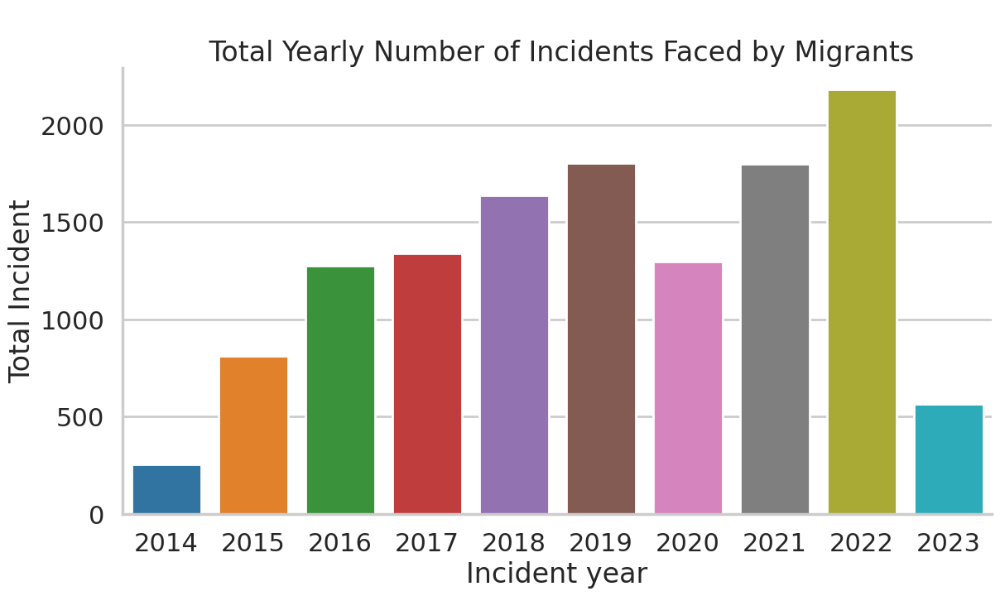

In [73]:
sns.set_style("whitegrid")
sns.set_context("poster")
sns.catplot(data=migration_df, x = 'Incident year', kind = 'count', height=7, aspect = 1.8)
plt.title('\n Total Yearly Number of Incidents Faced by Migrants')
plt.ylabel('Total Incident')
plt.show()

#### The total number of incidents faced by immigrants has been going up except for the year 2020 possibly due to pause in migration due to COVID-19. I believe the full report is not yet included in this data. <br>

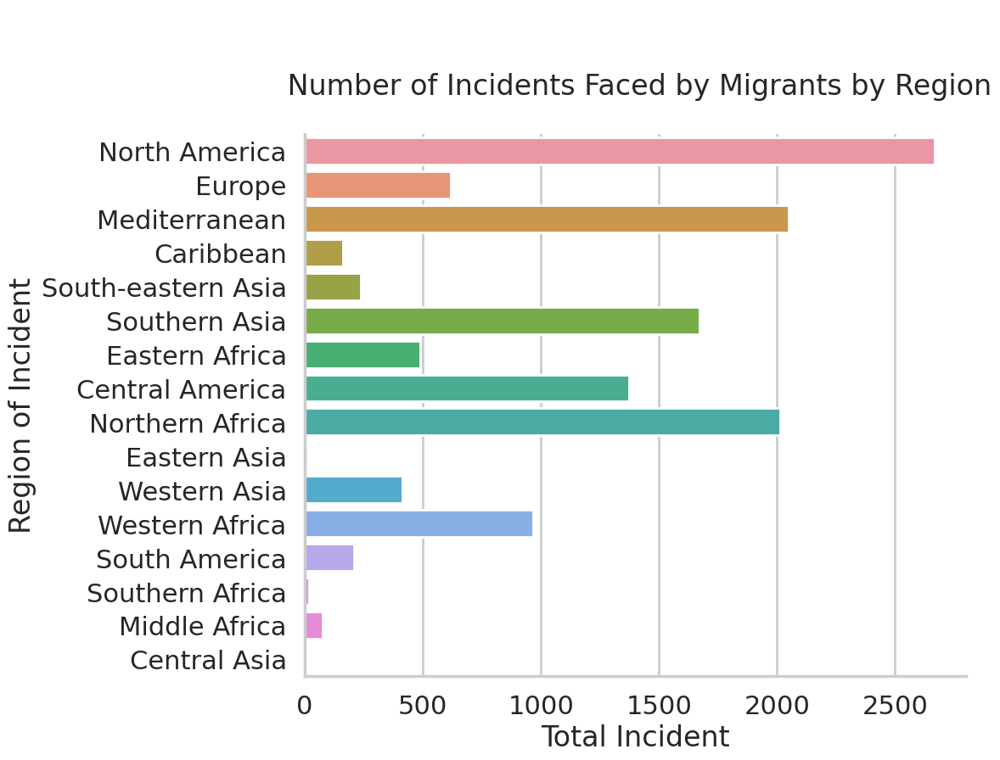

In [74]:
sns.set_style("whitegrid")
sns.catplot(data=migration_df, y = 'Region of Incident', kind = 'count', height=8, aspect = 1.5)
plt.xlabel('Total Incident')
plt.title('\n\n Number of Incidents Faced by Migrants by Region\n')
plt.show()

#### Noth America is region is where migrants face the most incidents while Mediterranean, North Africa and and Southern Asia are also where a lot of incidents occured over the past 10 years. Now let's look at total number of yearly death or missing migrants.

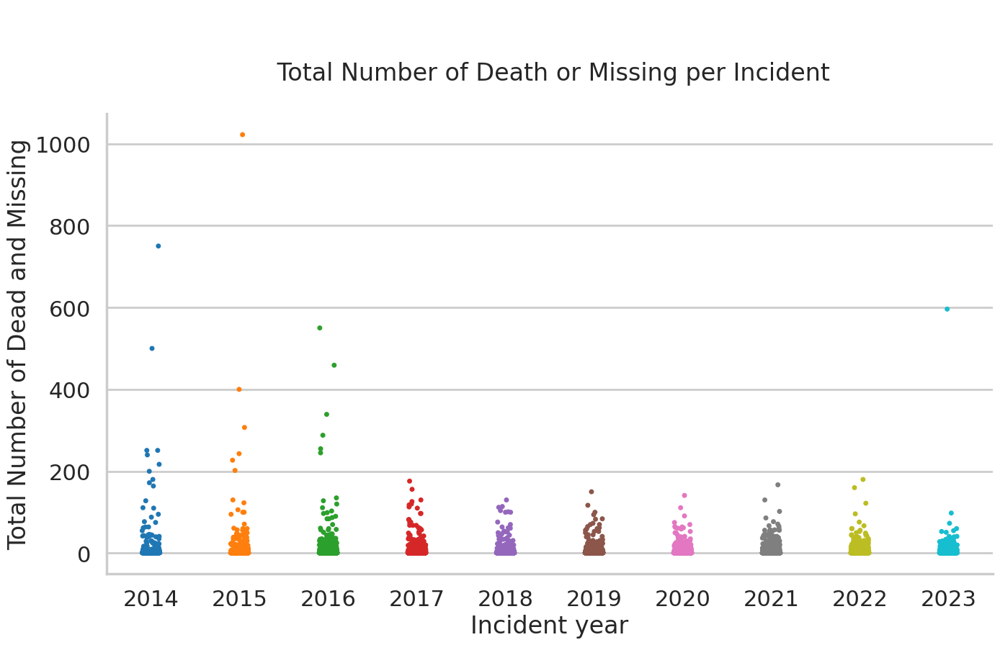

In [75]:
sns.catplot(data = migration_df, x = 'Incident year', y = 'Total Number of Dead and Missing', height=8, aspect = 1.8)
plt.title('\n\n Total Number of Death or Missing per Incident\n')
plt.show()

#### Over 1000 people were reported dead or missing at one incident in 2015 . Now let's look at total number of death or missing of female migrants.<br>

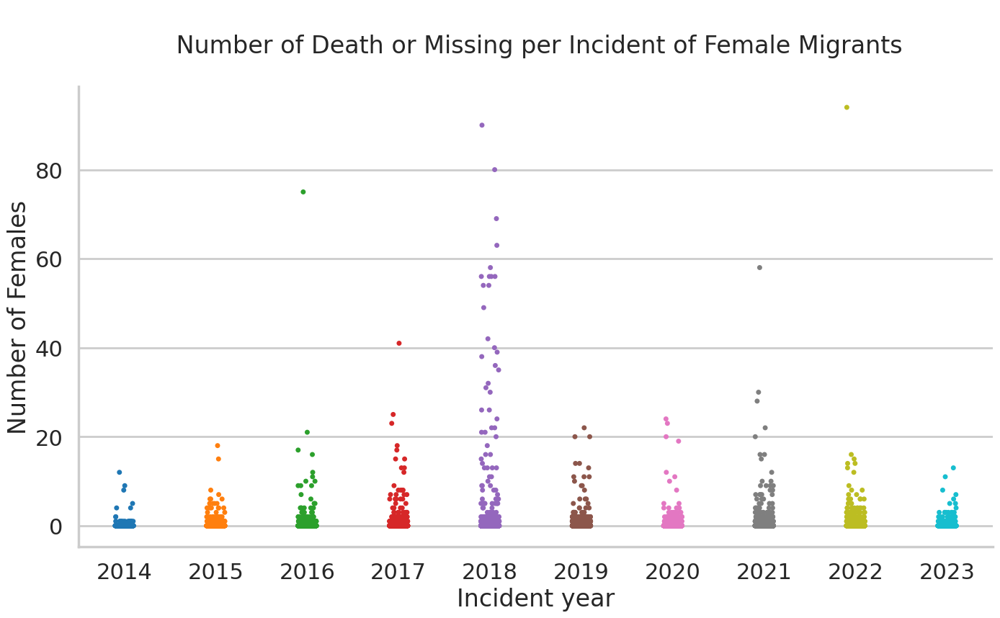

In [76]:
sns.catplot(data = migration_df, x = 'Incident year', y = 'Number of Females', height=8, aspect = 1.8)
plt.title('\n Number of Death or Missing per Incident of Female Migrants\n')
plt.show()

#### Let's look at the total number of death or missing reported over the last 10 years

In [77]:
total_dead_or_missing = []
for year in migration_df['Incident year'].unique():
    total_dead_or_missing.append(migration_df[migration_df['Incident year'] == year]['Total Number of Dead and Missing'].sum())

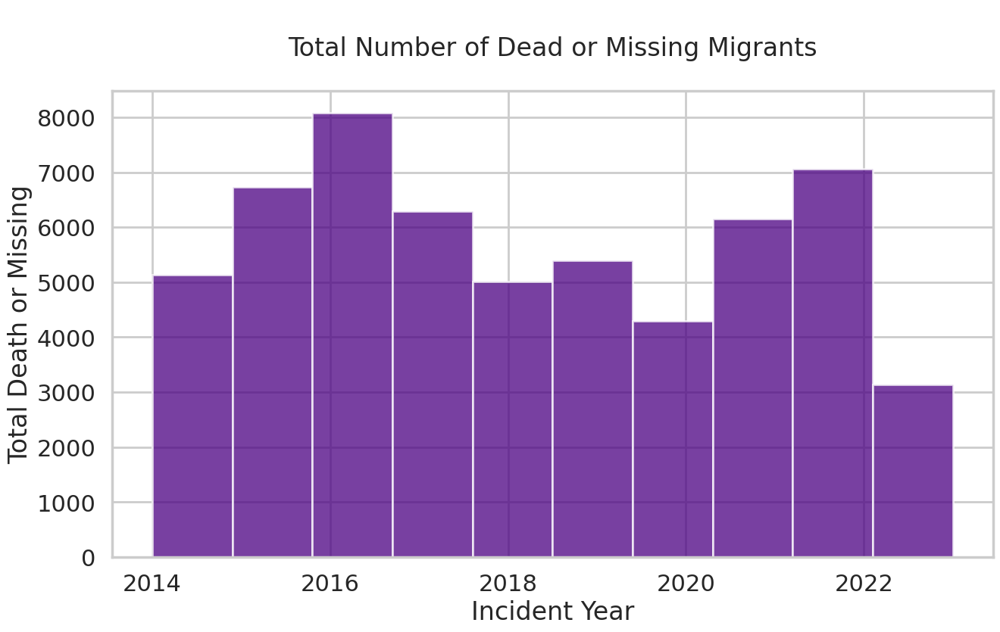

In [78]:
fig, ax = plt.subplots(figsize=(15,8))
ax.hist(migration_df['Incident year'].unique(), weights=total_dead_or_missing, color='indigo', alpha=0.75)
ax.set_xlabel('Incident Year')
ax.set_ylabel('Total Death or Missing')
ax.set_title('\nTotal Number of Dead or Missing Migrants\n')
plt.show()

### Total Death or Missing by Gender and Age <br>

In [79]:
total_dead_or_missing_women = []
for year in migration_df['Incident year'].unique():
    total_dead_or_missing_women.append(migration_df[migration_df['Incident year'] == year]['Number of Females'].sum())

In [80]:
total_dead_or_missing_men = []
for year in migration_df['Incident year'].unique():
    total_dead_or_missing_men.append(migration_df[migration_df['Incident year'] == year]['Number of Males'].sum())

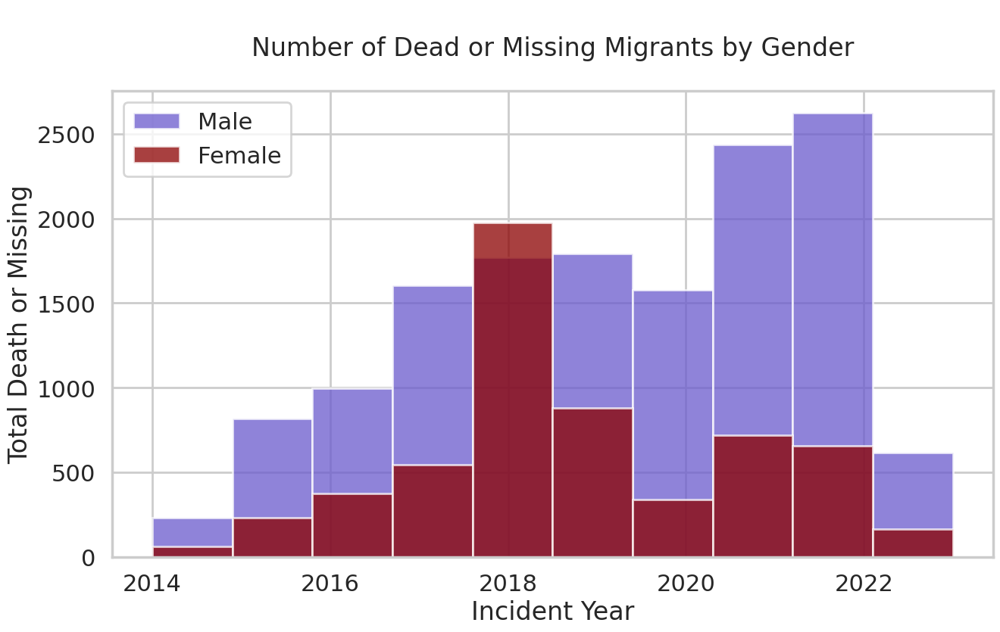

In [81]:
fig, ax = plt.subplots(figsize=(15,8))
ax.hist(migration_df['Incident year'].unique(), weights=total_dead_or_missing_men, color='slateblue', label='Male', alpha=0.75)
ax.hist(migration_df['Incident year'].unique(), weights=total_dead_or_missing_women, color='darkred', label='Female', alpha=0.75)
ax.set_xlabel('Incident Year')
ax.set_ylabel('Total Death or Missing')
ax.set_title('\nNumber of Dead or Missing Migrants by Gender\n')
plt.legend()
plt.show()

In [82]:
total_dead_or_missing_children = []
for year in migration_df['Incident year'].unique():
    total_dead_or_missing_children.append(migration_df[migration_df['Incident year'] == year]['Number of Children'].sum())

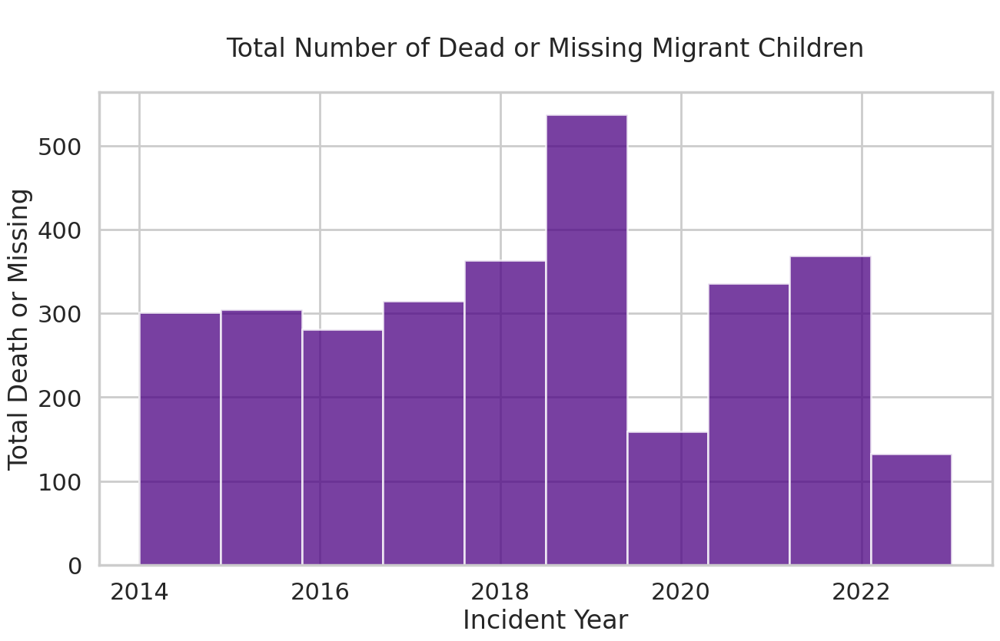

In [83]:
fig, ax = plt.subplots(figsize=(15,8))
ax.hist(migration_df['Incident year'].unique(), weights=total_dead_or_missing_children, color='indigo', alpha=0.75)
ax.set_xlabel('Incident Year')
ax.set_ylabel('Total Death or Missing')
ax.set_title('\nTotal Number of Dead or Missing Migrant Children\n')
plt.show()

### Let's look at the leading causes of death of the migrants <br>

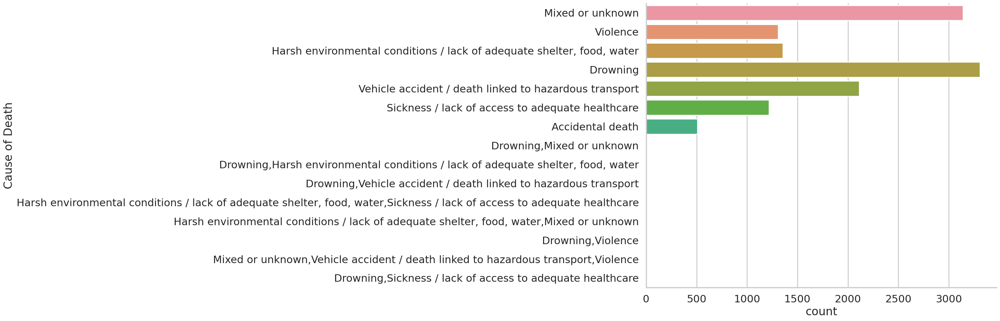

In [84]:
sns.catplot(data=migration_df, y = 'Cause of Death', kind = 'count', height=10, aspect = 3.0)
plt.show()

#### Combinations of causes and Drowning are the leading causes of death of migrants. Let's examine the missing and confirmed dead. <br>

In [85]:
total_dead = []
for year in migration_df['Incident year'].unique():
    total_dead.append(migration_df[migration_df['Incident year'] == year]['Number of Dead'].sum())
    
total_missing = []
for year in migration_df['Incident year'].unique():
    total_missing.append(migration_df[migration_df['Incident year'] == year]['Minimum Estimated Number of Missing'].sum())

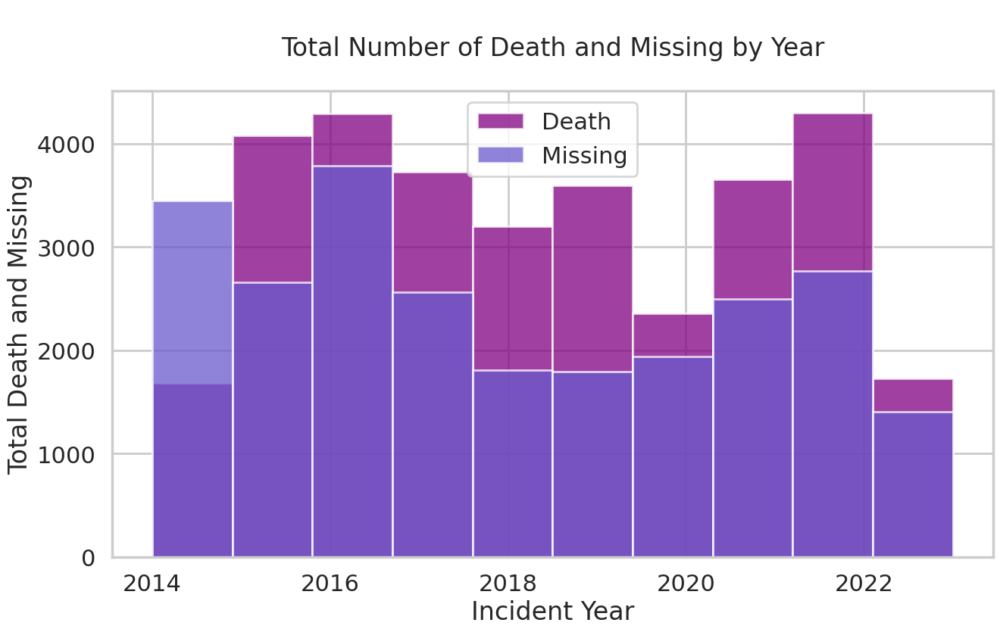

In [86]:
fig, ax = plt.subplots(figsize=(15,8))
ax.hist(migration_df['Incident year'].unique(), weights=total_dead, color='purple', alpha=0.75, label='Death')
ax.hist(migration_df['Incident year'].unique(), weights=total_missing, color='slateblue', alpha=0.75, label='Missing')

ax.set_xlabel('Incident Year')
ax.set_ylabel('Total Death and Missing')
ax.set_title('\nTotal Number of Death and Missing by Year\n')
plt.legend(loc='upper center')
plt.show()

In [87]:
def changeToFloat(data):
    latitude, longitude = [], []
    for i in range(len(data)):
        try:
            splitted = data[i].split(',')
        except:
            KeyError
        latitude.append(float(splitted[0]))
        longitude.append(float(splitted[1])) 
        
    return latitude, longitude

In [88]:
lat, long = changeToFloat(migration_df['Coordinates'])

In [89]:
import folium

In [90]:
incident_location = folium.Map(location=(0, 0), tiles = 'cartodbdark_matter', zoom_start = 2.2)

for i in range(len(lat)):
    folium.Circle(location = [lat[i], long[i]],
    radius=10,
    color= 'crimson',
    fill_opacity = 100,
    fill_color = 'crimson').add_to(incident_location)
    
incident_location